# Setup

In [1]:
# import your standard packages
%run pkgs.py

# import your local functions
sys.path.insert(1, '../')
from local_functions import *

# make sure the figures plot inline rather than at the end
%matplotlib inline

Default libraries loaded.


# Paths and Parameters

In [2]:
bounds_AS = [68,79,3,20]
bounds_wBoB = [79,87,2,21]
bounds_BoB = [87,100,0,23]

# bounds_AS = [68,79,3,16]
# bounds_wBoB = [79,87,2,16]
# bounds_BoB = [87,100,0,16]

# Read Data

In [3]:
# SLA
ds_SLA = xr.open_dataset('../data/sla_to_wod.nc')
ds_SLA

<xarray.Dataset>
Dimensions:    (time: 341437)
Coordinates:
  * time       (time) datetime64[ns] 1770-01-01 1770-01-01 ... 2020-05-31
Data variables:
    daily_sla  (time) float64 ...
    lon        (time) float64 ...
    lat        (time) float64 ...

In [4]:
# WOA
ds_WOD = xr.open_dataset('../data/wod_processed.nc')
ds_WOD


<xarray.Dataset>
Dimensions:                      (coastal_loc: 341437, coastal_pos: 139423, lonmin,lonmax,latmin,latmax: 4, pres: 57, time: 341437)
Coordinates:
  * time                         (time) datetime64[ns] 1770-01-01 ... 2020-05-31
  * pres                         (pres) int64 0 5 10 15 ... 1350 1400 1450 1500
  * coastal_loc                  (coastal_loc) int64 0 1 2 ... 341435 341436
  * coastal_pos                  (coastal_pos) int64 0 1 2 ... 139421 139422
  * lonmin,lonmax,latmin,latmax  (lonmin,lonmax,latmin,latmax) int64 0 1 2 3
Data variables:
    temp                         (time, pres) float64 ...
    sal                          (time, pres) float64 ...
    doxy                         (time, pres) float64 ...
    nitrate                      (time, pres) float64 ...
    phosphate                    (time, pres) float64 ...
    lat                          (time) float32 ...
    lon                          (time) float32 ...
    cast_id                      (ti

# Whole Indian Ocean Scatterplots

Text(0, 0.5, 'temp')

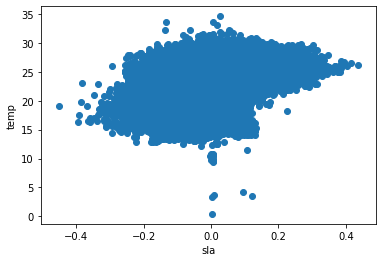

In [5]:
sla = ds_SLA.daily_sla
temp = ds_WOD.temp_50_200
doxy = ds_WOD.doxy_50_200

plt.scatter(sla,temp)
plt.xlabel('sla')
plt.ylabel('temp')
# plt.ylim([0,150])

Text(0, 0.5, 'doxy')

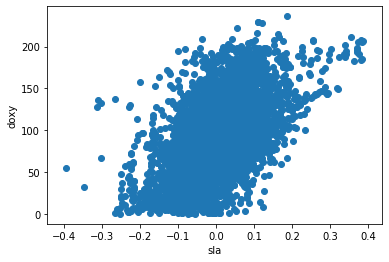

In [6]:
plt.scatter(sla,doxy)
plt.xlabel('sla')
plt.ylabel('doxy')

Text(0, 0.5, 'doxy')

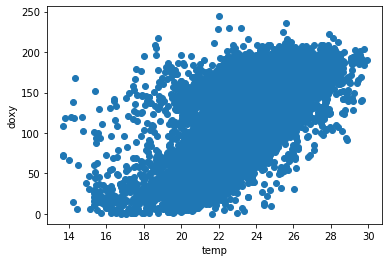

In [7]:
plt.scatter(temp,doxy)
plt.xlabel('temp')
plt.ylabel('doxy')

# Subset for AS and BoB

In [8]:
#----------------- Arabian Sea ---------------------#

ind_AS = (ds_WOD.lon < bounds_AS[1]) & (ds_WOD.lon > bounds_AS[0]) & (ds_WOD.lat < bounds_AS[3]) & (ds_WOD.lat > bounds_AS[2]) 

#subset gridded data
temp_AS = np.array(ds_WOD.temp_50_200[ind_AS])
doxy_AS = np.array(ds_WOD.doxy_50_200[ind_AS])
sal_AS = np.array(ds_WOD.sal_50_200[ind_AS])
# nitrate_AS = np.array(ds_WOD.nitrate_50_200[ind_AS])
sla_AS = np.array(ds_SLA.daily_sla[ind_AS])
lat_AS = np.array(ds_WOD.lat[ind_AS])
lon_AS = np.array(ds_WOD.lon[ind_AS])
    
# convert to coastal
mask_AS = mask_coast(lon_AS,lat_AS,np.array(ds_WOD.coastal_mask_bounds))
lat_AS = lat_AS[mask_AS]
lon_AS = lon_AS[mask_AS]
temp_AS = temp_AS[mask_AS]
doxy_AS = doxy_AS[mask_AS]
sal_AS = sal_AS[mask_AS]
# nitrate_AS = nitrate_AS[mask_AS]
sla_AS = sla_AS[mask_AS]

ind = np.isnan(sla_AS) | np.isnan(temp_AS)

print('Length AS: ', len(temp_AS[~ind]))

#---------------- Western Bay of Bengal --------------------#

ind_wBoB = (ds_WOD.lon < bounds_wBoB[1]) & (ds_WOD.lon > bounds_wBoB[0]) & (ds_WOD.lat < bounds_wBoB[3]) & (ds_WOD.lat > bounds_wBoB[2]) 

#subset gridded data
temp_wBoB = np.array(ds_WOD.temp_50_200[ind_wBoB])
doxy_wBoB = np.array(ds_WOD.doxy_50_200[ind_wBoB])
sal_wBoB = np.array(ds_WOD.sal_50_200[ind_wBoB])
# nitrate_wBoB = np.array(ds_WOD.nitrate_50_200[ind_wBoB])
sla_wBoB = np.array(ds_SLA.daily_sla[ind_wBoB])
lat_wBoB = np.array(ds_WOD.lat[ind_wBoB])
lon_wBoB = np.array(ds_WOD.lon[ind_wBoB])
    
# convert to coastal
mask_wBoB = mask_coast(lon_wBoB,lat_wBoB,np.array(ds_WOD.coastal_mask_bounds))
lon_wBoB = lon_wBoB[mask_wBoB]
lat_wBoB = lat_wBoB[mask_wBoB]
temp_wBoB = temp_wBoB[mask_wBoB]
doxy_wBoB = doxy_wBoB[mask_wBoB]
sal_wBoB = sal_wBoB[mask_wBoB]
# nitrate_wBoB = nitrate_wBoB[mask_wBoB]
sla_wBoB = sla_wBoB[mask_wBoB]

ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)

print('Length wBoB: ', len(temp_wBoB[~ind]))

#---------------- Bay of Bengal --------------------#

ind_BoB = (ds_WOD.lon < bounds_BoB[1]) & (ds_WOD.lon > bounds_BoB[0]) & (ds_WOD.lat < bounds_BoB[3]) & (ds_WOD.lat > bounds_BoB[2]) 

#subset gridded data
temp_BoB = np.array(ds_WOD.temp_50_200[ind_BoB])
doxy_BoB = np.array(ds_WOD.doxy_50_200[ind_BoB])
sal_BoB = np.array(ds_WOD.sal_50_200[ind_BoB])
# nitrate_BoB = np.array(ds_WOD.nitrate_50_200[ind_BoB])
sla_BoB = np.array(ds_SLA.daily_sla[ind_BoB])
lat_BoB = np.array(ds_WOD.lat[ind_BoB])
lon_BoB = np.array(ds_WOD.lon[ind_BoB])

# convert to coastal
mask_BoB = mask_coast(lon_BoB,lat_BoB,np.array(ds_WOD.coastal_mask_bounds))
lon_BoB = lon_BoB[mask_BoB]
lat_BoB = lat_BoB[mask_BoB]
temp_BoB = temp_BoB[mask_BoB]
doxy_BoB = doxy_BoB[mask_BoB]
sal_BoB = sal_BoB[mask_BoB]
# nitrate_BoB = nitrate_BoB[mask_BoB]
sla_BoB = sla_BoB[mask_BoB]

ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)

print('Length BoB: ', len(temp_BoB[~ind]))

Length AS:  4714
Length wBoB:  7449
Length BoB:  8173


# Find Correlations

In [9]:
# SLA/temp
slope_sla_temp, intercept_sla_temp, r_value_sla_temp, p_value_sla_temp, std_err_temp_sla,latbins,lonbins,temp_bncts_temp_sla,_ = interannual_space_correlate(ds_SLA.daily_sla,
                                                                                                                               ds_WOD.temp_50_200,
                                                                                                                               ds_WOD.lat,
                                                                                                                               ds_WOD.lon,
                                                                                                                               binwidth = 2)
# SLA/doxy
slope_sla_doxy, intercept_sla_doxy, r_value_sla_doxy, p_value_sla_doxy, std_err_doxy_sla,_,_,_,doxy_bncts_doxy_sla  = interannual_space_correlate(ds_SLA.daily_sla,
                                                                                                                                ds_WOD.doxy_50_200,
                                                                                                                                ds_WOD.lat,
                                                                                                                                ds_WOD.lon,
                                                                                                                                binwidth = 2)
# temp/doxy
slope_temp_doxy, intercept_temp_doxy, r_value_temp_doxy, p_value_temp_doxy, std_err_temp_doxy,_,_,_,doxy_bncts_temp_doxy  = interannual_space_correlate(ds_WOD.temp_50_200,
                                                                                                                                ds_WOD.doxy_50_200,
                                                                                                                                ds_WOD.lat,
                                                                                                                                ds_WOD.lon,
                                                                                                                                binwidth = 2)

/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:142: RuntimeWarning: invalid value encountered in double_scalars
  sterrest = np.sqrt((1 - r**2) * ssym / ssxm / df)
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jennap/anaconda3/lib/python3.7/site-

In [10]:
xx,yy = np.meshgrid(lonbins,latbins)
xx,yy = xx.flatten(),yy.flatten()

mask = mask_coast(xx,yy,np.array(ds_WOD.coastal_mask_bounds))
xx,yy = xx[mask],yy[mask]

# Find Solubility

In [11]:
O2_sat_AS = o2sat(temp_AS,sal_AS)
O2_sat_wBoB = o2sat(temp_wBoB,sal_wBoB)
O2_sat_BoB = o2sat(temp_BoB,sal_BoB)

O2_per_sat_AS = doxy_AS/O2_sat_AS*100
O2_per_sat_wBoB = doxy_wBoB/O2_sat_wBoB*100
O2_per_sat_BoB = doxy_BoB/O2_sat_BoB*100

O2_anom_AS = O2_sat_AS
O2_anom_wBoB = doxy_wBoB - O2_sat_wBoB
O2_anom_BoB = doxy_BoB - O2_sat_BoB

# Plot

min temp/sla r val:  0.0
max temp/sla r val:  0.8910232042479364
min temp/doxy r val:  0.0
max temp/doxy r val:  1.0


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:154: RuntimeWarning: invalid value encountered in greater_equal


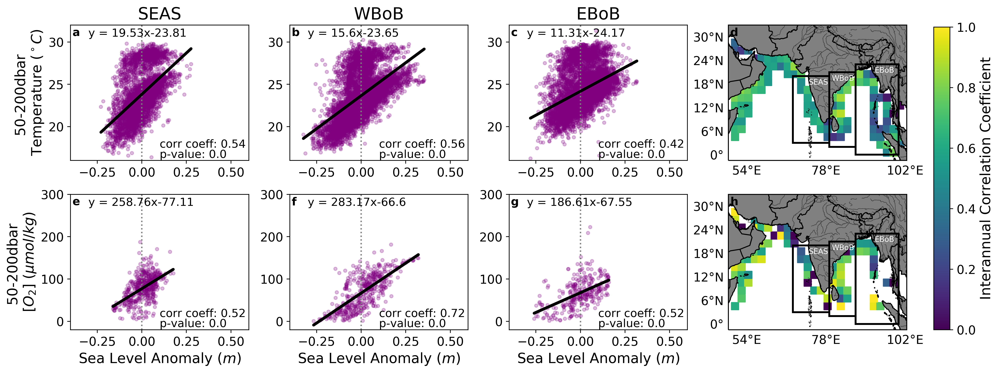

In [12]:
fig = plt.figure(figsize=(16,6),dpi=400)

sz = 12
sq_sz = 60
fsz = 12
alpha = 0.25

cmin = 0
cmax = 1

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
cmap = plt.cm.viridis

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################

xlim = [-0.4,0.6]
ylim = [16,32]

ax = fig.add_subplot(241)
ind = np.isnan(sla_AS) | np.isnan(temp_AS)
p = ax.scatter(sla_AS[~ind],temp_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ = stats.linregress(sla_AS[~ind],temp_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('SEAS')
ax.set_ylabel('50-200dbar \nTemperature ($^\circ C$)')
add_letter(ax, 'a', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(242)
ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(sla_wBoB[~ind],temp_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind],temp_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('WBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'b', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(243)
ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)
p = ax.scatter(sla_BoB[~ind],temp_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind],temp_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('EBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'c', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(244,projection= ccrs.PlateCarree())
var = r_value_sla_temp.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'd', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla r val: ', np.nanmin(var[rm_mask]))
print('max temp/sla r val: ', np.nanmax(var[rm_mask]))

#-------------------------------------------------------------
xlim = [-0.4,0.6]
ylim = [-20,300]

ax = fig.add_subplot(245)
ind = np.isnan(sla_AS) | np.isnan(doxy_AS)
ax.scatter(sla_AS[~ind],doxy_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_AS[~ind], doxy_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_ylabel('50-200dbar \n[$O_2$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'e', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(246)
ind = np.isnan(sla_wBoB) | np.isnan(doxy_wBoB)
ax.scatter(sla_wBoB[~ind],doxy_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind], doxy_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'f', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(247)
ind = np.isnan(sla_BoB) | np.isnan(doxy_BoB)
ax.scatter(sla_BoB[~ind],doxy_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind], doxy_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'g', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)

ax = fig.add_subplot(248,projection= ccrs.PlateCarree())
var = r_value_sla_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'h', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')


# max and mins 
print('min temp/doxy r val: ', np.nanmin(var[rm_mask]))
print('max temp/doxy r val: ', np.nanmax(var[rm_mask]))


plt.subplots_adjust(hspace = 0.25, wspace = 0.23)

add_single_vert_cbar(fig,p,'Interannual Correlation Coefficient')

# Regression Slope, p-val, bincounts 50-200

/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:98: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:125: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:158: RuntimeWarning: invalid value encountered in greater_equal


min temp/sla p val:  3.5212870649686105e-210
max temp/sla p val:  0.9730640306040516
min doxy/sla p val:  0.0
max doxy/sla p val:  0.9399936513080848
min temp/sla slope:  0.43474896053619627
max temp/sla slope:  28.246356432621567
min doxy/sla slope:  7.637560343923015
max doxy/sla slope:  145203.6759541031


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: RuntimeWarning: invalid value encountered in greater_equal


min temp/sla bncts:  1.0
max temp/sla bncts:  4008.0
min doxy/sla bncts:  1.0
max doxy/sla bncts:  176.0


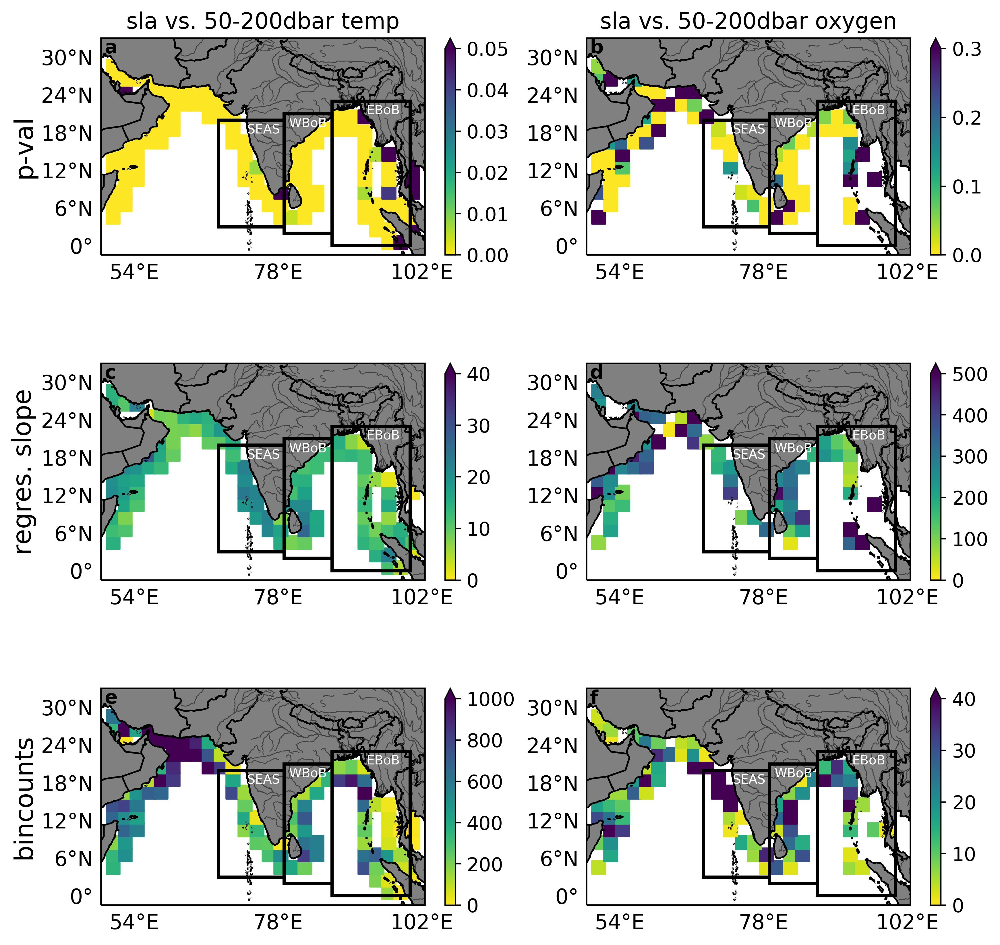

In [13]:
fig = plt.figure(figsize=(10,10),dpi=400)

sz = 70
fsz = 12
alpha = 0.25

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
cmap = plt.cm.viridis_r

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 12,
         'axes.labelsize': 12,
         'axes.titlesize': 14,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)



##############################################################
# P-Values

cmin = 0
cmax = 0.05

cmin1 = 0
cmax1 = 0.3

ax = fig.add_subplot(321,projection= ccrs.PlateCarree())
var = p_value_sla_temp.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
plt.colorbar(p,ax=ax, extend = 'max')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'a', x = 0.01,y=0.93)
ax.set_title('sla vs. 50-200dbar temp')
ylabel_map(ax,'p-val',x = -0.2, y = 0.5, fsz = 16)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla p val: ', np.nanmin(var[rm_mask]))
print('max temp/sla p val: ', np.nanmax(var[rm_mask]))

#----------------------------------------------------------------------------

ax = fig.add_subplot(322,projection= ccrs.PlateCarree())
var = p_value_sla_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sz,cmap=cmap,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
plt.colorbar(p,ax=ax, extend = 'max')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'b', x = 0.01,y=0.93)
ax.set_title('sla vs. 50-200dbar oxygen')
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min doxy/sla p val: ', np.nanmin(var[rm_mask]))
print('max doxy/sla p val: ', np.nanmax(var[rm_mask]))

# add_single_vert_cbar(fig,p,'Seasonal \nP-value', loc = [0.925, 0.55, 0.015, 0.32])

#----------------------------------------------------------------------------
# Regression Slopes

cmin = 0
cmax = 40

cmin2 = 0
cmax2 = 500

ax = fig.add_subplot(323,projection= ccrs.PlateCarree())
var = slope_sla_temp.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
plt.colorbar(p,ax=ax, extend = 'max')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'c', x = 0.01,y=0.93)
ylabel_map(ax,'regres. slope',x = -0.2, y = 0.5, fsz = 16)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla slope: ', np.nanmin(var[rm_mask]))
print('max temp/sla slope: ', np.nanmax(var[rm_mask]))

#----------------------------------------------------------------------------

ax = fig.add_subplot(324,projection= ccrs.PlateCarree())
var = slope_sla_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sz,cmap=cmap,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
plt.colorbar(p,ax=ax, extend = 'max')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'd', x = 0.01,y=0.93)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min doxy/sla slope: ', np.nanmin(var[rm_mask]))
print('max doxy/sla slope: ', np.nanmax(var[rm_mask]))

#----------------------------------------------------------------------------
# bincounts

cmin = 0
cmax = 1000

cmin2 = 0
cmax2 = 40

ax = fig.add_subplot(325,projection= ccrs.PlateCarree())
var = temp_bncts_temp_sla.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
plt.colorbar(p,ax=ax, extend = 'max')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'e', x = 0.01,y=0.93)
ylabel_map(ax,'bincounts',x = -0.2, y = 0.5, fsz = 16)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla bncts: ', np.nanmin(var[rm_mask]))
print('max temp/sla bncts: ', np.nanmax(var[rm_mask]))

#----------------------------------------------------------------------------
ax = fig.add_subplot(326,projection= ccrs.PlateCarree())
var = doxy_bncts_doxy_sla.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sz,cmap=cmap,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
plt.colorbar(p,ax=ax, extend = 'max')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'f', x = 0.01,y=0.93)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min doxy/sla bncts: ', np.nanmin(var[rm_mask]))
print('max doxy/sla bncts: ', np.nanmax(var[rm_mask]))



# add_single_vert_cbar(fig,p,'Seasonal \nRegression Slope', loc = [0.925, 0.1, 0.015, 0.32])

plt.subplots_adjust(hspace = 0.5)

# Temperature vs Doxy

min temp/doxy r val:  0.0
max temp/doxy r val:  0.9740452607191423


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: RuntimeWarning: invalid value encountered in greater_equal


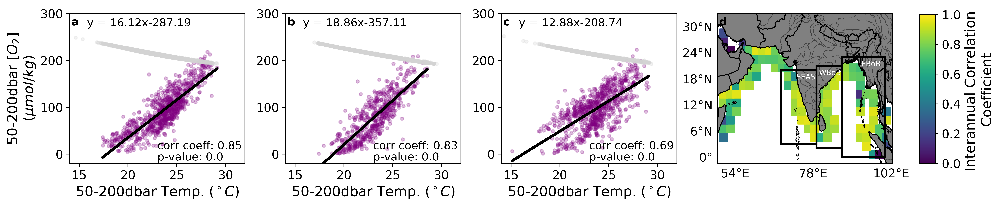

In [14]:
fig = plt.figure(figsize=(16,3),dpi=400)

sz = 12
sq_sz = 80
fsz = 12
alpha = 0.25

cmin = 0
cmax = 1

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
cmap = plt.cm.viridis

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################
ylim = [-20,300]
xlim = [14,32]

ax = fig.add_subplot(141)
ind = np.isnan(temp_AS) | np.isnan(doxy_AS)
ax.scatter(temp_AS[~ind],doxy_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.scatter(temp_AS,O2_sat_AS,c = sat_clr,s= sz,alpha = alpha)
m, b, r, p_val,_ =stats.linregress(temp_AS[~ind], doxy_AS[~ind])
ax.plot(temp_AS[~ind], m*temp_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_ylabel('50-200dbar [$O_2$] \n($\mu mol/ kg$)')
ax.set_xlabel('50-200dbar Temp. ($^\circ C$)')
add_letter(ax, 'a', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)

ax = fig.add_subplot(142)
ind = np.isnan(temp_wBoB) | np.isnan(doxy_wBoB)
ax.scatter(temp_wBoB[~ind],doxy_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.scatter(temp_wBoB,O2_sat_wBoB,c = sat_clr,s= sz,alpha = alpha)
m, b, r, p_val,_ =stats.linregress(temp_wBoB[~ind], doxy_wBoB[~ind])
ax.plot(temp_wBoB[~ind], m*temp_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticklabels([])
ax.set_xlabel('50-200dbar Temp. ($^\circ C$)')
add_letter(ax, 'b', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)

ax = fig.add_subplot(143)
ind = np.isnan(temp_BoB) | np.isnan(doxy_BoB)
ax.scatter(temp_BoB[~ind],doxy_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.scatter(temp_BoB,O2_sat_BoB,c = sat_clr,s= sz,alpha = alpha)
m, b, r, p_val,_ =stats.linregress(temp_BoB[~ind], doxy_BoB[~ind])
ax.plot(temp_BoB[~ind], m*temp_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticklabels([])
ax.set_xlabel('50-200dbar Temp. ($^\circ C$)')
add_letter(ax, 'c', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(144,projection= ccrs.PlateCarree())
var = r_value_temp_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'd', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')


# max and mins 
print('min temp/doxy r val: ', np.nanmin(var[rm_mask]))
print('max temp/doxy r val: ', np.nanmax(var[rm_mask]))


plt.subplots_adjust(hspace = 0.25, wspace = 0.23)

add_single_vert_cbar(fig,p,'Interannual Correlation \nCoefficient')

# Redo for 40-200


In [15]:
# SLA/temp
slope_sla_temp, intercept_sla_temp, r_value_sla_temp, p_value_sla_temp, std_err_temp_sla,latbins,lonbins,temp_bncts_temp_sla,_ = interannual_space_correlate(ds_SLA.daily_sla,
                                                                                                                               ds_WOD.temp_40_200,
                                                                                                                               ds_WOD.lat,
                                                                                                                               ds_WOD.lon,
                                                                                                                               binwidth = 2)
# SLA/doxy
slope_sla_doxy, intercept_sla_doxy, r_value_sla_doxy, p_value_sla_doxy, std_err_doxy_sla,_,_,_,doxy_bncts_doxy_sla  = interannual_space_correlate(ds_SLA.daily_sla,
                                                                                                                                ds_WOD.doxy_40_200,
                                                                                                                                ds_WOD.lat,
                                                                                                                                ds_WOD.lon,
                                                                                                                                binwidth = 2)
# temp/doxy
slope_temp_doxy, intercept_temp_doxy, r_value_temp_doxy, p_value_temp_doxy, std_err_temp_doxy,_,_,_,doxy_bncts_temp_doxy  = interannual_space_correlate(ds_WOD.temp_50_200,
                                                                                                                                ds_WOD.doxy_40_200,
                                                                                                                                ds_WOD.lat,
                                                                                                                                ds_WOD.lon,
                                                                                                                                binwidth = 2)

#----------------- Arabian Sea ---------------------#

ind_AS = (ds_WOD.lon < bounds_AS[1]) & (ds_WOD.lon > bounds_AS[0]) & (ds_WOD.lat < bounds_AS[3]) & (ds_WOD.lat > bounds_AS[2]) 

#subset gridded data
temp_AS = np.array(ds_WOD.temp_40_200[ind_AS])
doxy_AS = np.array(ds_WOD.doxy_40_200[ind_AS])
sal_AS = np.array(ds_WOD.sal_40_200[ind_AS])
# nitrate_AS = np.array(ds_WOD.nitrate_40_200[ind_AS])
sla_AS = np.array(ds_SLA.daily_sla[ind_AS])
lat_AS = np.array(ds_WOD.lat[ind_AS])
lon_AS = np.array(ds_WOD.lon[ind_AS])
    
# convert to coastal
mask_AS = mask_coast(lon_AS,lat_AS,np.array(ds_WOD.coastal_mask_bounds))
lat_AS = lat_AS[mask_AS]
lon_AS = lon_AS[mask_AS]
temp_AS = temp_AS[mask_AS]
doxy_AS = doxy_AS[mask_AS]
sal_AS = sal_AS[mask_AS]
# nitrate_AS = nitrate_AS[mask_AS]
sla_AS = sla_AS[mask_AS]

ind = np.isnan(sla_AS) | np.isnan(temp_AS)

print('Length AS: ', len(temp_AS[~ind]))

#---------------- Western Bay of Bengal --------------------#

ind_wBoB = (ds_WOD.lon < bounds_wBoB[1]) & (ds_WOD.lon > bounds_wBoB[0]) & (ds_WOD.lat < bounds_wBoB[3]) & (ds_WOD.lat > bounds_wBoB[2]) 

#subset gridded data
temp_wBoB = np.array(ds_WOD.temp_40_200[ind_wBoB])
doxy_wBoB = np.array(ds_WOD.doxy_40_200[ind_wBoB])
sal_wBoB = np.array(ds_WOD.sal_40_200[ind_wBoB])
# nitrate_wBoB = np.array(ds_WOD.nitrate_40_200[ind_wBoB])
sla_wBoB = np.array(ds_SLA.daily_sla[ind_wBoB])
lat_wBoB = np.array(ds_WOD.lat[ind_wBoB])
lon_wBoB = np.array(ds_WOD.lon[ind_wBoB])
    
# convert to coastal
mask_wBoB = mask_coast(lon_wBoB,lat_wBoB,np.array(ds_WOD.coastal_mask_bounds))
lon_wBoB = lon_wBoB[mask_wBoB]
lat_wBoB = lat_wBoB[mask_wBoB]
temp_wBoB = temp_wBoB[mask_wBoB]
doxy_wBoB = doxy_wBoB[mask_wBoB]
sal_wBoB = sal_wBoB[mask_wBoB]
# nitrate_wBoB = nitrate_wBoB[mask_wBoB]
sla_wBoB = sla_wBoB[mask_wBoB]

ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)

print('Length wBoB: ', len(temp_wBoB[~ind]))

#---------------- Bay of Bengal --------------------#

ind_BoB = (ds_WOD.lon < bounds_BoB[1]) & (ds_WOD.lon > bounds_BoB[0]) & (ds_WOD.lat < bounds_BoB[3]) & (ds_WOD.lat > bounds_BoB[2]) 

#subset gridded data
temp_BoB = np.array(ds_WOD.temp_40_200[ind_BoB])
doxy_BoB = np.array(ds_WOD.doxy_40_200[ind_BoB])
sal_BoB = np.array(ds_WOD.sal_40_200[ind_BoB])
# nitrate_BoB = np.array(ds_WOD.nitrate_40_200[ind_BoB])
sla_BoB = np.array(ds_SLA.daily_sla[ind_BoB])
lat_BoB = np.array(ds_WOD.lat[ind_BoB])
lon_BoB = np.array(ds_WOD.lon[ind_BoB])

# convert to coastal
mask_BoB = mask_coast(lon_BoB,lat_BoB,np.array(ds_WOD.coastal_mask_bounds))
lon_BoB = lon_BoB[mask_BoB]
lat_BoB = lat_BoB[mask_BoB]
temp_BoB = temp_BoB[mask_BoB]
doxy_BoB = doxy_BoB[mask_BoB]
sal_BoB = sal_BoB[mask_BoB]
# nitrate_BoB = nitrate_BoB[mask_BoB]
sla_BoB = sla_BoB[mask_BoB]

ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)

print('Length BoB: ', len(temp_BoB[~ind]))

/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:142: RuntimeWarning: invalid value encountered in double_scalars
  sterrest = np.sqrt((1 - r**2) * ssym / ssxm / df)
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jennap/anaconda3/lib/python3.7/site-

Length AS:  4729
Length wBoB:  7461
Length BoB:  8195


min temp/sla r val:  0.0
max temp/sla r val:  0.8933456055695004


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:154: RuntimeWarning: invalid value encountered in greater_equal


min temp/doxy r val:  0.0
max temp/doxy r val:  1.0


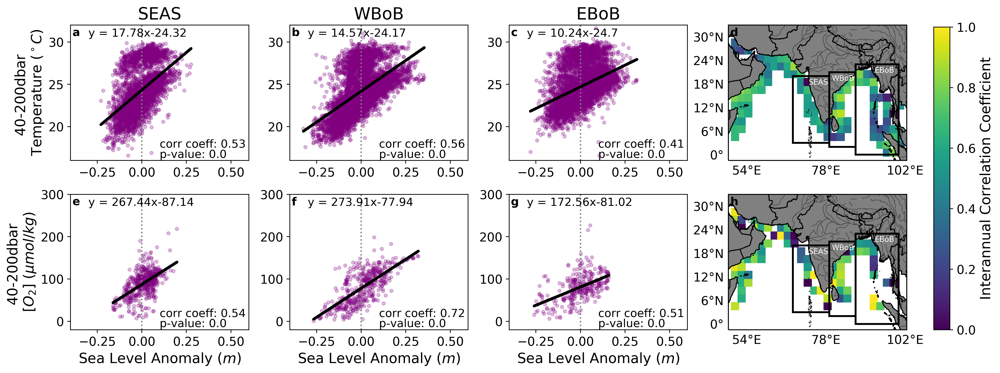

In [16]:
fig = plt.figure(figsize=(16,6),dpi=400)

sz = 12
sq_sz = 60
fsz = 12
alpha = 0.25

cmin = 0
cmax = 1

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
cmap = plt.cm.viridis

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################

xlim = [-0.4,0.6]
ylim = [16,32]

ax = fig.add_subplot(241)
ind = np.isnan(sla_AS) | np.isnan(temp_AS)
p = ax.scatter(sla_AS[~ind],temp_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ = stats.linregress(sla_AS[~ind],temp_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('SEAS')
ax.set_ylabel('40-200dbar \nTemperature ($^\circ C$)')
add_letter(ax, 'a', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(242)
ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(sla_wBoB[~ind],temp_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind],temp_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('WBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'b', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(243)
ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)
p = ax.scatter(sla_BoB[~ind],temp_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind],temp_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('EBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'c', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(244,projection= ccrs.PlateCarree())
var = r_value_sla_temp.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'd', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla r val: ', np.nanmin(var[rm_mask]))
print('max temp/sla r val: ', np.nanmax(var[rm_mask]))

#-------------------------------------------------------------
xlim = [-0.4,0.6]
ylim = [-20,300]

ax = fig.add_subplot(245)
ind = np.isnan(sla_AS) | np.isnan(doxy_AS)
ax.scatter(sla_AS[~ind],doxy_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_AS[~ind], doxy_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_ylabel('40-200dbar \n[$O_2$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'e', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(246)
ind = np.isnan(sla_wBoB) | np.isnan(doxy_wBoB)
ax.scatter(sla_wBoB[~ind],doxy_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind], doxy_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'f', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(247)
ind = np.isnan(sla_BoB) | np.isnan(doxy_BoB)
ax.scatter(sla_BoB[~ind],doxy_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind], doxy_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'g', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)

ax = fig.add_subplot(248,projection= ccrs.PlateCarree())
var = r_value_sla_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'h', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')


# max and mins 
print('min temp/doxy r val: ', np.nanmin(var[rm_mask]))
print('max temp/doxy r val: ', np.nanmax(var[rm_mask]))


plt.subplots_adjust(hspace = 0.25, wspace = 0.23)

add_single_vert_cbar(fig,p,'Interannual Correlation Coefficient')

# Redo for 50-225

In [17]:
# SLA/temp
slope_sla_temp, intercept_sla_temp, r_value_sla_temp, p_value_sla_temp, std_err_temp_sla,latbins,lonbins,temp_bncts_temp_sla,_ = interannual_space_correlate(ds_SLA.daily_sla,
                                                                                                                               ds_WOD.temp_50_225,
                                                                                                                               ds_WOD.lat,
                                                                                                                               ds_WOD.lon,
                                                                                                                               binwidth = 2)
# SLA/doxy
slope_sla_doxy, intercept_sla_doxy, r_value_sla_doxy, p_value_sla_doxy, std_err_doxy_sla,_,_,_,doxy_bncts_doxy_sla  = interannual_space_correlate(ds_SLA.daily_sla,
                                                                                                                                ds_WOD.doxy_50_225,
                                                                                                                                ds_WOD.lat,
                                                                                                                                ds_WOD.lon,
                                                                                                                                binwidth = 2)
# temp/doxy
slope_temp_doxy, intercept_temp_doxy, r_value_temp_doxy, p_value_temp_doxy, std_err_temp_doxy,_,_,_,doxy_bncts_temp_doxy  = interannual_space_correlate(ds_WOD.temp_50_200,
                                                                                                                                ds_WOD.doxy_50_225,
                                                                                                                                ds_WOD.lat,
                                                                                                                                ds_WOD.lon,
                                                                                                                                binwidth = 2)

#----------------- Arabian Sea ---------------------#

ind_AS = (ds_WOD.lon < bounds_AS[1]) & (ds_WOD.lon > bounds_AS[0]) & (ds_WOD.lat < bounds_AS[3]) & (ds_WOD.lat > bounds_AS[2]) 

#subset gridded data
temp_AS = np.array(ds_WOD.temp_50_225[ind_AS])
doxy_AS = np.array(ds_WOD.doxy_50_225[ind_AS])
sal_AS = np.array(ds_WOD.sal_50_225[ind_AS])
# nitrate_AS = np.array(ds_WOD.nitrate_50_225[ind_AS])
sla_AS = np.array(ds_SLA.daily_sla[ind_AS])
lat_AS = np.array(ds_WOD.lat[ind_AS])
lon_AS = np.array(ds_WOD.lon[ind_AS])
    
# convert to coastal
mask_AS = mask_coast(lon_AS,lat_AS,np.array(ds_WOD.coastal_mask_bounds))
lat_AS = lat_AS[mask_AS]
lon_AS = lon_AS[mask_AS]
temp_AS = temp_AS[mask_AS]
doxy_AS = doxy_AS[mask_AS]
sal_AS = sal_AS[mask_AS]
# nitrate_AS = nitrate_AS[mask_AS]
sla_AS = sla_AS[mask_AS]

ind = np.isnan(sla_AS) | np.isnan(temp_AS)

print('Length AS: ', len(temp_AS[~ind]))

#---------------- Western Bay of Bengal --------------------#

ind_wBoB = (ds_WOD.lon < bounds_wBoB[1]) & (ds_WOD.lon > bounds_wBoB[0]) & (ds_WOD.lat < bounds_wBoB[3]) & (ds_WOD.lat > bounds_wBoB[2]) 

#subset gridded data
temp_wBoB = np.array(ds_WOD.temp_50_225[ind_wBoB])
doxy_wBoB = np.array(ds_WOD.doxy_50_225[ind_wBoB])
sal_wBoB = np.array(ds_WOD.sal_50_225[ind_wBoB])
# nitrate_wBoB = np.array(ds_WOD.nitrate_50_225[ind_wBoB])
sla_wBoB = np.array(ds_SLA.daily_sla[ind_wBoB])
lat_wBoB = np.array(ds_WOD.lat[ind_wBoB])
lon_wBoB = np.array(ds_WOD.lon[ind_wBoB])
    
# convert to coastal
mask_wBoB = mask_coast(lon_wBoB,lat_wBoB,np.array(ds_WOD.coastal_mask_bounds))
lon_wBoB = lon_wBoB[mask_wBoB]
lat_wBoB = lat_wBoB[mask_wBoB]
temp_wBoB = temp_wBoB[mask_wBoB]
doxy_wBoB = doxy_wBoB[mask_wBoB]
sal_wBoB = sal_wBoB[mask_wBoB]
# nitrate_wBoB = nitrate_wBoB[mask_wBoB]
sla_wBoB = sla_wBoB[mask_wBoB]

ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)

print('Length wBoB: ', len(temp_wBoB[~ind]))

#---------------- Bay of Bengal --------------------#

ind_BoB = (ds_WOD.lon < bounds_BoB[1]) & (ds_WOD.lon > bounds_BoB[0]) & (ds_WOD.lat < bounds_BoB[3]) & (ds_WOD.lat > bounds_BoB[2]) 

#subset gridded data
temp_BoB = np.array(ds_WOD.temp_50_225[ind_BoB])
doxy_BoB = np.array(ds_WOD.doxy_50_225[ind_BoB])
sal_BoB = np.array(ds_WOD.sal_50_225[ind_BoB])
# nitrate_BoB = np.array(ds_WOD.nitrate_50_225[ind_BoB])
sla_BoB = np.array(ds_SLA.daily_sla[ind_BoB])
lat_BoB = np.array(ds_WOD.lat[ind_BoB])
lon_BoB = np.array(ds_WOD.lon[ind_BoB])

# convert to coastal
mask_BoB = mask_coast(lon_BoB,lat_BoB,np.array(ds_WOD.coastal_mask_bounds))
lon_BoB = lon_BoB[mask_BoB]
lat_BoB = lat_BoB[mask_BoB]
temp_BoB = temp_BoB[mask_BoB]
doxy_BoB = doxy_BoB[mask_BoB]
sal_BoB = sal_BoB[mask_BoB]
# nitrate_BoB = nitrate_BoB[mask_BoB]
sla_BoB = sla_BoB[mask_BoB]

ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)

print('Length BoB: ', len(temp_BoB[~ind]))

/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:142: RuntimeWarning: invalid value encountered in double_scalars
  sterrest = np.sqrt((1 - r**2) * ssym / ssxm / df)
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:130: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/home/jennap/anaconda3/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:140: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jennap/anaconda3/lib/python3.7/site-

Length AS:  4716
Length wBoB:  7449
Length BoB:  8173


min temp/sla r val:  0.0
max temp/sla r val:  0.8760996387389293
min temp/doxy r val:  0.0
max temp/doxy r val:  1.0


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:154: RuntimeWarning: invalid value encountered in greater_equal


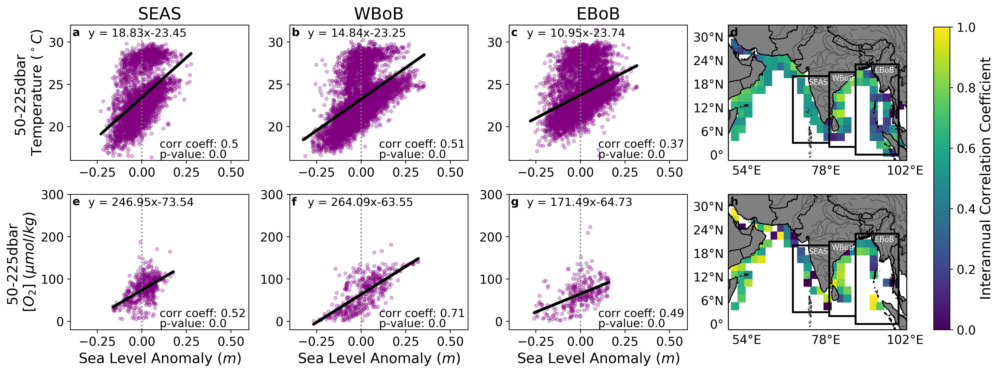

In [18]:
fig = plt.figure(figsize=(16,6),dpi=400)

sz = 12
sq_sz = 60
fsz = 12
alpha = 0.25

cmin = 0
cmax = 1

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
cmap = plt.cm.viridis

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################

xlim = [-0.4,0.6]
ylim = [16,32]

ax = fig.add_subplot(241)
ind = np.isnan(sla_AS) | np.isnan(temp_AS)
p = ax.scatter(sla_AS[~ind],temp_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ = stats.linregress(sla_AS[~ind],temp_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('SEAS')
ax.set_ylabel('50-225dbar \nTemperature ($^\circ C$)')
add_letter(ax, 'a', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(242)
ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(sla_wBoB[~ind],temp_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind],temp_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('WBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'b', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(243)
ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)
p = ax.scatter(sla_BoB[~ind],temp_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind],temp_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('EBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'c', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(244,projection= ccrs.PlateCarree())
var = r_value_sla_temp.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'd', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla r val: ', np.nanmin(var[rm_mask]))
print('max temp/sla r val: ', np.nanmax(var[rm_mask]))

#-------------------------------------------------------------
xlim = [-0.4,0.6]
ylim = [-20,300]

ax = fig.add_subplot(245)
ind = np.isnan(sla_AS) | np.isnan(doxy_AS)
ax.scatter(sla_AS[~ind],doxy_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_AS[~ind], doxy_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_ylabel('50-225dbar \n[$O_2$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'e', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(246)
ind = np.isnan(sla_wBoB) | np.isnan(doxy_wBoB)
ax.scatter(sla_wBoB[~ind],doxy_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind], doxy_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'f', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(247)
ind = np.isnan(sla_BoB) | np.isnan(doxy_BoB)
ax.scatter(sla_BoB[~ind],doxy_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind], doxy_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'g', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)

ax = fig.add_subplot(248,projection= ccrs.PlateCarree())
var = r_value_sla_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'h', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')


# max and mins 
print('min temp/doxy r val: ', np.nanmin(var[rm_mask]))
print('max temp/doxy r val: ', np.nanmax(var[rm_mask]))


plt.subplots_adjust(hspace = 0.25, wspace = 0.23)

add_single_vert_cbar(fig,p,'Interannual Correlation Coefficient')

# Spatial Map of Points Used for Correlations

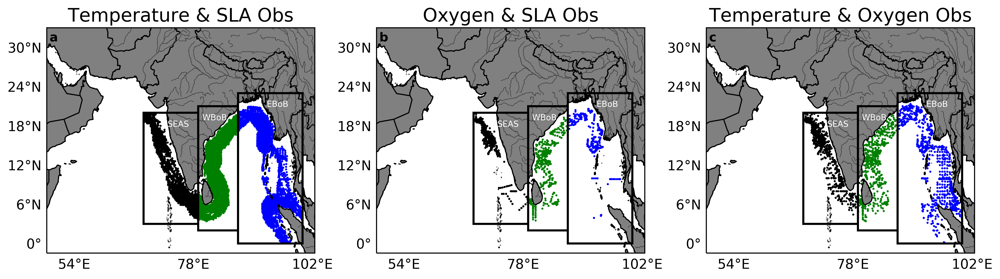

In [19]:
fig = plt.figure(figsize=(16,4),dpi=400)

sz = 1
sq_sz = 60
fsz = 12
alpha = 0.25


sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################

xlim = [-0.4,0.6]
ylim = [16,32]

ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
ind = np.isnan(sla_AS) | np.isnan(temp_AS)
p = ax.scatter(lon_AS[~ind],lat_AS[~ind], c='k', s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(lon_wBoB[~ind],lat_wBoB[~ind], c='g', s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)
p = ax.scatter(lon_BoB[~ind],lat_BoB[~ind], c='b', s = sz,transform=ccrs.PlateCarree())
ax.set_title('Temperature & SLA Obs')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'a', x = 0.01,y=0.94)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ind = np.isnan(sla_AS) | np.isnan(doxy_AS)
p = ax.scatter(lon_AS[~ind],lat_AS[~ind], c='k', s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_wBoB) | np.isnan(doxy_wBoB)
p = ax.scatter(lon_wBoB[~ind],lat_wBoB[~ind], c='g', s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(sla_BoB) | np.isnan(doxy_BoB)
p = ax.scatter(lon_BoB[~ind],lat_BoB[~ind], c='b', s = sz,transform=ccrs.PlateCarree())
ax.set_title('Oxygen & SLA Obs')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'b', x = 0.01,y=0.94)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
ind = np.isnan(doxy_AS) | np.isnan(temp_AS)
p = ax.scatter(lon_AS[~ind],lat_AS[~ind], c='k', s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(doxy_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(lon_wBoB[~ind],lat_wBoB[~ind], c='g', s = sz,transform=ccrs.PlateCarree())
ind = np.isnan(doxy_BoB) | np.isnan(temp_BoB)
p = ax.scatter(lon_BoB[~ind],lat_BoB[~ind], c='b', s = sz,transform=ccrs.PlateCarree())
ax.set_title('Temperature & Oxygen Obs')
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'c', x = 0.01,y=0.94)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

plt.subplots_adjust(hspace = 0.25, wspace = 0.23)

# Redo for WOD18

In [20]:
# WOA
ds_WOD = xr.open_dataset('../data/wod18_processed.nc')
ds_WOD

<xarray.Dataset>
Dimensions:                      (coastal_loc: 337497, coastal_pos: 138914, lonmin,lonmax,latmin,latmax: 4, pres: 57, time: 337497)
Coordinates:
  * time                         (time) datetime64[ns] 1770-01-01 ... 2019-12-31
  * pres                         (pres) int64 0 5 10 15 ... 1350 1400 1450 1500
  * coastal_loc                  (coastal_loc) int64 0 1 2 ... 337495 337496
  * coastal_pos                  (coastal_pos) int64 0 1 2 ... 138912 138913
  * lonmin,lonmax,latmin,latmax  (lonmin,lonmax,latmin,latmax) int64 0 1 2 3
Data variables:
    temp                         (time, pres) float64 ...
    sal                          (time, pres) float64 ...
    doxy                         (time, pres) float64 ...
    nitrate                      (time, pres) float64 ...
    phosphate                    (time, pres) float64 ...
    lat                          (time) float32 ...
    lon                          (time) float32 ...
    cast_id                      (ti

In [21]:
# SLA
ds_SLA = xr.open_dataset('../data/sla_to_wod18.nc')
ds_SLA

<xarray.Dataset>
Dimensions:    (time: 337497)
Coordinates:
  * time       (time) datetime64[ns] 1770-01-01 1770-01-01 ... 2019-12-31
Data variables:
    daily_sla  (time) float64 ...
    lon        (time) float64 ...
    lat        (time) float64 ...

In [22]:
#----------------- Arabian Sea ---------------------#

ind_AS = (ds_WOD.lon < bounds_AS[1]) & (ds_WOD.lon > bounds_AS[0]) & (ds_WOD.lat < bounds_AS[3]) & (ds_WOD.lat > bounds_AS[2]) 

#subset gridded data
temp_AS = np.array(ds_WOD.temp_50_200[ind_AS])
doxy_AS = np.array(ds_WOD.doxy_50_200[ind_AS])
sal_AS = np.array(ds_WOD.sal_50_200[ind_AS])
# nitrate_AS = np.array(ds_WOD.nitrate_50_200[ind_AS])
sla_AS = np.array(ds_SLA.daily_sla[ind_AS])
lat_AS = np.array(ds_WOD.lat[ind_AS])
lon_AS = np.array(ds_WOD.lon[ind_AS])
    
# convert to coastal
mask_AS = mask_coast(lon_AS,lat_AS,np.array(ds_WOD.coastal_mask_bounds))
lat_AS = lat_AS[mask_AS]
lon_AS = lon_AS[mask_AS]
temp_AS = temp_AS[mask_AS]
doxy_AS = doxy_AS[mask_AS]
sal_AS = sal_AS[mask_AS]
# nitrate_AS = nitrate_AS[mask_AS]
sla_AS = sla_AS[mask_AS]

ind = np.isnan(sla_AS) | np.isnan(temp_AS)

print('Length AS: ', len(temp_AS[~ind]))

#---------------- Western Bay of Bengal --------------------#

ind_wBoB = (ds_WOD.lon < bounds_wBoB[1]) & (ds_WOD.lon > bounds_wBoB[0]) & (ds_WOD.lat < bounds_wBoB[3]) & (ds_WOD.lat > bounds_wBoB[2]) 

#subset gridded data
temp_wBoB = np.array(ds_WOD.temp_50_200[ind_wBoB])
doxy_wBoB = np.array(ds_WOD.doxy_50_200[ind_wBoB])
sal_wBoB = np.array(ds_WOD.sal_50_200[ind_wBoB])
# nitrate_wBoB = np.array(ds_WOD.nitrate_50_200[ind_wBoB])
sla_wBoB = np.array(ds_SLA.daily_sla[ind_wBoB])
lat_wBoB = np.array(ds_WOD.lat[ind_wBoB])
lon_wBoB = np.array(ds_WOD.lon[ind_wBoB])
    
# convert to coastal
mask_wBoB = mask_coast(lon_wBoB,lat_wBoB,np.array(ds_WOD.coastal_mask_bounds))
lon_wBoB = lon_wBoB[mask_wBoB]
lat_wBoB = lat_wBoB[mask_wBoB]
temp_wBoB = temp_wBoB[mask_wBoB]
doxy_wBoB = doxy_wBoB[mask_wBoB]
sal_wBoB = sal_wBoB[mask_wBoB]
# nitrate_wBoB = nitrate_wBoB[mask_wBoB]
sla_wBoB = sla_wBoB[mask_wBoB]

ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)

print('Length wBoB: ', len(temp_wBoB[~ind]))

#---------------- Bay of Bengal --------------------#

ind_BoB = (ds_WOD.lon < bounds_BoB[1]) & (ds_WOD.lon > bounds_BoB[0]) & (ds_WOD.lat < bounds_BoB[3]) & (ds_WOD.lat > bounds_BoB[2]) 

#subset gridded data
temp_BoB = np.array(ds_WOD.temp_50_200[ind_BoB])
doxy_BoB = np.array(ds_WOD.doxy_50_200[ind_BoB])
sal_BoB = np.array(ds_WOD.sal_50_200[ind_BoB])
# nitrate_BoB = np.array(ds_WOD.nitrate_50_200[ind_BoB])
sla_BoB = np.array(ds_SLA.daily_sla[ind_BoB])
lat_BoB = np.array(ds_WOD.lat[ind_BoB])
lon_BoB = np.array(ds_WOD.lon[ind_BoB])

# convert to coastal
mask_BoB = mask_coast(lon_BoB,lat_BoB,np.array(ds_WOD.coastal_mask_bounds))
lon_BoB = lon_BoB[mask_BoB]
lat_BoB = lat_BoB[mask_BoB]
temp_BoB = temp_BoB[mask_BoB]
doxy_BoB = doxy_BoB[mask_BoB]
sal_BoB = sal_BoB[mask_BoB]
# nitrate_BoB = nitrate_BoB[mask_BoB]
sla_BoB = sla_BoB[mask_BoB]

ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)

print('Length BoB: ', len(temp_BoB[~ind]))

Length AS:  4644
Length wBoB:  7353
Length BoB:  8060


min temp/sla r val:  0.0
max temp/sla r val:  0.8760996387389293
min temp/doxy r val:  0.0
max temp/doxy r val:  1.0


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in greater_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:154: RuntimeWarning: invalid value encountered in greater_equal


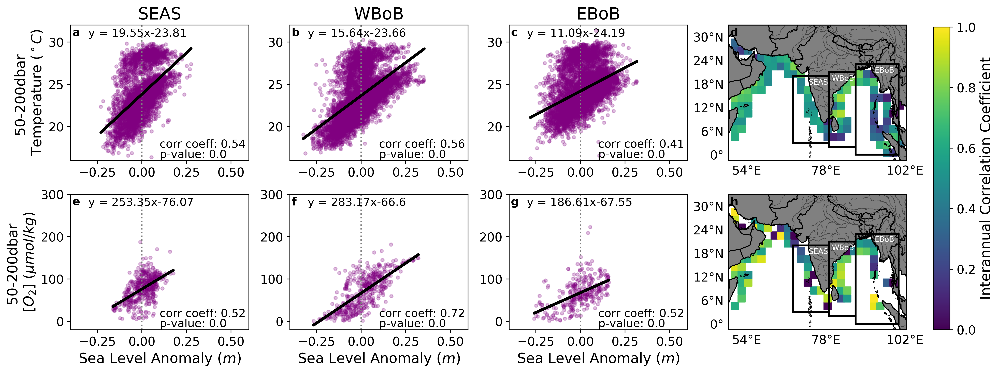

In [23]:
fig = plt.figure(figsize=(16,6),dpi=400)

sz = 12
sq_sz = 60
fsz = 12
alpha = 0.25

cmin = 0
cmax = 1

# cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
cmap = plt.cm.viridis

sp_clr = 'purple'
sat_clr = 'lightgrey'

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################

xlim = [-0.4,0.6]
ylim = [16,32]

ax = fig.add_subplot(241)
ind = np.isnan(sla_AS) | np.isnan(temp_AS)
p = ax.scatter(sla_AS[~ind],temp_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ = stats.linregress(sla_AS[~ind],temp_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('SEAS')
ax.set_ylabel('50-200dbar \nTemperature ($^\circ C$)')
add_letter(ax, 'a', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(242)
ind = np.isnan(sla_wBoB) | np.isnan(temp_wBoB)
p = ax.scatter(sla_wBoB[~ind],temp_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind],temp_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('WBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'b', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(243)
ind = np.isnan(sla_BoB) | np.isnan(temp_BoB)
p = ax.scatter(sla_BoB[~ind],temp_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind],temp_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_title('EBoB')
ax.tick_params(axis='x',labelbottom='off')
ax.tick_params(axis='y',labelbottom='off')
add_letter(ax, 'c', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(244,projection= ccrs.PlateCarree())
var = r_value_sla_temp.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'd', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')

# max and mins 
print('min temp/sla r val: ', np.nanmin(var[rm_mask]))
print('max temp/sla r val: ', np.nanmax(var[rm_mask]))

#-------------------------------------------------------------
xlim = [-0.4,0.6]
ylim = [-20,300]

ax = fig.add_subplot(245)
ind = np.isnan(sla_AS) | np.isnan(doxy_AS)
ax.scatter(sla_AS[~ind],doxy_AS[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_AS[~ind], doxy_AS[~ind])
ax.plot(sla_AS[~ind], m*sla_AS[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_ylabel('50-200dbar \n[$O_2$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'e', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(246)
ind = np.isnan(sla_wBoB) | np.isnan(doxy_wBoB)
ax.scatter(sla_wBoB[~ind],doxy_wBoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_wBoB[~ind], doxy_wBoB[~ind])
ax.plot(sla_wBoB[~ind], m*sla_wBoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'f', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)


ax = fig.add_subplot(247)
ind = np.isnan(sla_BoB) | np.isnan(doxy_BoB)
ax.scatter(sla_BoB[~ind],doxy_BoB[~ind],c = sp_clr,s= sz,alpha = alpha)
ax.axvline(x=0,color = 'gray',linestyle = ':')
m, b, r, p_val,_ =stats.linregress(sla_BoB[~ind], doxy_BoB[~ind])
ax.plot(sla_BoB[~ind], m*sla_BoB[~ind] + b, 'k', linewidth = 3)
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xlabel('Sea Level Anomaly ($m$)')
add_letter(ax, 'g', x = 0.01,y=0.92)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.915, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.5,y=0.095, fontsize = fsz)
add_text(ax, 'p-value: ' + str(np.round(p_val,4)), x = 0.5,y=0.02, fontsize = fsz)

ax = fig.add_subplot(248,projection= ccrs.PlateCarree())
var = r_value_sla_doxy.flatten()[mask]
rm_mask = var >= 0
p = ax.scatter(xx[rm_mask],yy[rm_mask],c = var[rm_mask],
           marker='s',s= sq_sz,cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 13}
g.ylabel_style = {'size': 13}
add_letter(ax, 'h', x = 0.01,y=0.92)
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
add_box(ax,box_bounds,clrs)
add_text(ax, 'SEAS', x = 0.45,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.82,y=0.65, fontsize = 8, color = 'w')


# max and mins 
print('min temp/doxy r val: ', np.nanmin(var[rm_mask]))
print('max temp/doxy r val: ', np.nanmax(var[rm_mask]))


plt.subplots_adjust(hspace = 0.25, wspace = 0.23)

add_single_vert_cbar(fig,p,'Interannual Correlation Coefficient')